<a href="https://colab.research.google.com/github/Tripti-Patel/LearningAndWorkingAI/blob/main/GoogleColab/CV_Assignment_Code_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import the Libraries

In [4]:
#Import all required libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.io import loadmat
from skimage.filters import threshold_otsu, threshold_multiotsu
from sklearn.cluster import KMeans
import cv2
import time
from collections import deque
from mpl_toolkits.mplot3d import Axes3D


# Image Preprocessing

In [5]:
# Load the Data
data = loadmat('Brain.mat')
T1 = data['T1']
label = data['label']

# Defining common functions for some algo

Comparision of Segmented Image with Original and Ground Truth Images

In [6]:
# Display segmentation result to be compared
def display_compared_images(t1_image, ground_truth, segmented_image, segmented_image_title):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 15))
    # Show T1 Image
    image1 = ax1.imshow(t1_image)
    fig.colorbar(image1, ax=ax1, location='bottom',pad=0.01)
    ax1.set_title('Original T1 Image', fontsize=15)
    ax1.axis('off')
    # Show Label Image with Colorbar
    image2 = ax2.imshow(ground_truth)
    fig.colorbar(image2, ax=ax2, location='bottom',pad=0.01)
    ax2.set_title('Label Image', fontsize=15)
    ax2.axis('off')
    # Show Segmented Image Slice
    image3 = ax3.imshow(segmented_image)
    fig.colorbar(image3, ax=ax3, location='bottom', pad=0.01)
    ax3.set_title(segmented_image_title, fontsize=15)
    ax3.axis('off')
    plt.show()

Image Evaluation Metrics

In [7]:
def image_evaluation_metrics(image, ground_truth, tm, print_metrics=True):
    # Calculate True Positives (TP), False Positives (FP), and False Negatives (FN)
    TP = np.sum(image & ground_truth)
    FP = np.sum(image & (~ground_truth))
    FN = np.sum((~image) & ground_truth)
    TN = np.sum((~image) & ground_truth)

    dice_coefficient = 2 * TP / (2 * TP + FP + FN) # Calculate Dice coefficient
    jaccard_index = TP / (TP + FP + FN)# Calculate Jaccard index
    pixel_accuracy = (TP + TN) / (TP + FP + TN + FN)# Calculate pixel accuracy
    sensitivity = TP / (TP + FN)# Calculate Sensitivity
    specificity = TN / (TN + FP)# Calculate Specificity

    if print_metrics:
      print(f"Dice coefficient: {dice_coefficient}", f"Jaccard index: {jaccard_index}",
            f"Pixel accuracy: {pixel_accuracy}", f"Sensitivity: {sensitivity}",
            f"Specificity: {specificity}", f"Computation Time: {tm}", sep='\n')
    return dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity, tm

# Task 1: 2D Tissue Segmentation

Function definition for different Image Segmentation Algorithms

In [8]:
# K-Mean Image Segmentation with default 5 clusters
def kmeans_segmentation(image, k_clusters = 5):
    image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    reshaped_image = np.reshape(image, (-1, 1))
    kmeans = KMeans(n_clusters=k_clusters, random_state=0, max_iter = 50, n_init=10)
    kmeans.fit(reshaped_image)
    segmented_image = np.reshape(kmeans.labels_, image.shape)
    return segmented_image
# Otsu Image Segmentation, auto thresholding
def otsu_segmentation(image):
    threshold = threshold_otsu(image)
    segmented_image = image > threshold
    return segmented_image
# Multi Otsu Segmentation
def multi_otsu_segmentation(image, region):
  image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
  thresholds = threshold_multiotsu(image, classes=region)
  # Using the threshold values, we generate the three regions.
  regions = np.digitize(image, bins=thresholds)
  return regions
# Adaptive Mean Thresholding
def adaptive_threshold_mean(image):
    image = cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    image = image.astype('uint8')
    thresholded_image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    return thresholded_image
# Generalised function to process image segmentation according to required algorithm, default is K-Mean
def segment_images(img_array, algo="kmeans", print_overall_metric = True ,k_clusters = 5):
  segmentation_result = []
  jaccard_indexes = []
  dice_coefficients = []
  pixel_accuracies = []
  sensitivities = []
  specificities = []
  times = []
  for i in range(10):
      t1 = time.monotonic()
      if algo == "kmeans":
        segmented_image = kmeans_segmentation(img_array[:,:,i], k_clusters)
        title = "K-Means" + str(k_clusters)+ " Clusters"
      elif algo == 'otsu':
        segmented_image = otsu_segmentation(img_array[:,:,i])
        title = "Otsu's Segmentation"
      elif algo == 'multi_otsu':
        segmented_image = multi_otsu_segmentation(img_array[:,:,i], k_clusters)
        title = "Multi Otsu Segmentation"
      elif algo == 'adaptive_threshold_mean':
        segmented_image = adaptive_threshold_mean(img_array[:,:,i])
        title = "Adaptive Mean Segmentation"

      display_compared_images(T1[:,:,i], label[:,:,i], segmented_image, title)
      print('Slice '+ str(i) + ' Image')
      segmentation_result.append(segmented_image)
      ji, dc, pa, se, sp, tm = image_evaluation_metrics(segmented_image, label[:,:,i], time.monotonic_ns() - t1)
      # Append results in metric array to calculate overall metric for each image
      jaccard_indexes.append(ji)
      dice_coefficients.append(dc)
      pixel_accuracies.append(pa)
      sensitivities.append(se)
      specificities.append(sp)
      times.append(tm)
  if print_overall_metric:
    print(f"------ Overall Metrics ------", f"Dice Coefficient: {np.mean(dice_coefficients)}",
          f"Jaccard Index: {np.mean(jaccard_indexes)}", f"Pixel Accuracy: {np.mean(pixel_accuracies)}",
          f"Sensitivity: {np.mean(sensitivities)}", f"Specificity: {np.mean(specificities)}",
          f"Computation Time: {np.mean(times)}",sep='\n')

  return segmentation_result


Algorithm for Region Growing Image Segmentaton

In [9]:
# Image segmentation using Region Growing Algo
def region_growing(image, seed_point, threshold):
    image =  cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
    mask = np.zeros_like(image, dtype=np.uint8)
    intensity_value = 255
    seed_points = [seed_point]
    while seed_points:
        current_point = seed_points.pop(0)
        if (0 <= current_point[0] < image.shape[0]) and (0 <= current_point[1] < image.shape[1]):
            if mask[current_point] == 0:
                if abs(int(image[current_point]) - int(image[seed_point])) < threshold:
                    mask[current_point] = intensity_value
                    # Add the 4 connected neighboring pixels to the seed points list
                    seed_points.append((current_point[0] + 1, current_point[1]))
                    seed_points.append((current_point[0] - 1, current_point[1]))
                    seed_points.append((current_point[0], current_point[1] + 1))
                    seed_points.append((current_point[0], current_point[1] - 1))

    return mask

# Merge images generated by region growing algorithm
def merge_images(img_array, intensity_arr):
  merged_image = np.zeros_like(img_array[0])
  alias_img = img_array
  for i in range(len(img_array)):
    alias_img[i] = np.where(alias_img[i] < 255, alias_img[i], intensity_arr[i])
    merged_image = np.maximum(merged_image, alias_img[i])
  return merged_image

# Customised algorithm to refine the specific CSF later
def csf_refining(target, ar2, ar3, ar4, ar5, ar6):
  new_arr = np.zeros_like(target)
  rows, columns = target.shape
  for r in range(rows):
    for c in range(columns):
      if ar2[r][c] > 0 or ar3[r][c] > 0 or ar4[r][c] > 0 or ar5[r][c] > 0 or ar6[r][c] > 0:
        new_arr[r][c] = 0
      else:
        new_arr[r][c] = target[r][c]
  return new_arr

Evalution Metric for Segmentation using Region Growing

In [10]:
# Evalution metrics for Images segmented using Region Growing
def image_evaluation_metrics_for_region_growing(image_array, comp_time, print_per_slice_metric=False, print_overall_metric=True):
  jaccard_indexes = []
  dice_coefficients = []
  pixel_accuracies = []
  sensitivities = []
  specificities = []
  times = []
  for i in range(len(image_array)):
    img = image_array[i]
    ji = []
    dc = []
    pa = []
    se = []
    sp = []
    tm = []
    for j in range(len(img)):
      img_label = img[j]
      dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity, comp = image_evaluation_metrics(img_label, label[:,:,i]==j, comp_time[j],print_metrics = False)
      dc.append(dice_coefficient)
      ji.append(jaccard_index)
      pa.append(pixel_accuracy)
      se.append(sensitivity)
      sp.append(specificity)
      tm.append(comp)
    jaccard_indexes.append(ji)
    dice_coefficients.append(dc)
    pixel_accuracies.append(pa)
    sensitivities.append(se)
    specificities.append(sp)
    times.append(tm)
    if print_per_slice_metric:
      print(f"------ Slice {i} ------", f"Dice Coefficient: {np.mean(dc)}", f"Jaccard Index: {np.mean(ji)}",
            f"Pixel Accuracy: {np.mean(pa)}", f"Sensitivity: {np.mean(se)}", f"Specificity: {np.mean(sp)}",
            f"Computation Time: {np.mean(tm)}",sep='\n')

  if print_overall_metric:
    print(f"------ Overall Metrics ------", f"Dice Coefficient: {np.mean(dice_coefficients)}",
          f"Jaccard Index: {np.mean(jaccard_indexes)}", f"Pixel Accuracy: {np.mean(pixel_accuracies)}",
          f"Sensitivity: {np.mean(sensitivities)}", f"Specificity: {np.mean(specificities)}",
          f"Computation Time: {np.mean(comp_time)}",sep='\n')

Image Segmentation using Otsu method

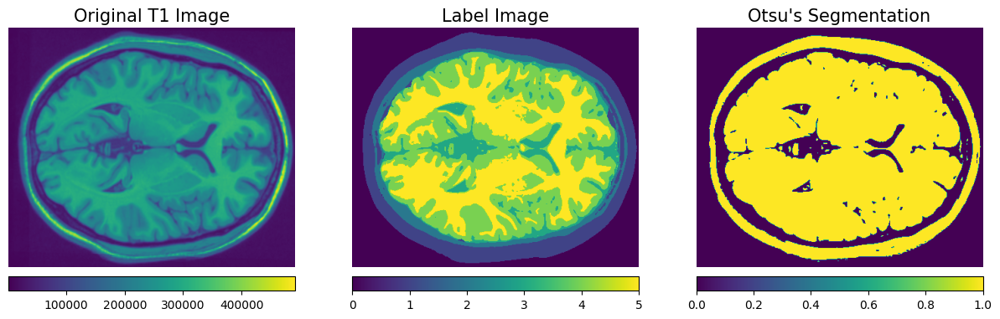

Slice 0 Image
Dice coefficient: 0.6800213410094794
Jaccard index: 0.5151760116557785
Pixel accuracy: 0.570559094125973
Sensitivity: 0.7997869452916369
Specificity: 0.266004885804025
Computation Time: 1476217829516.542


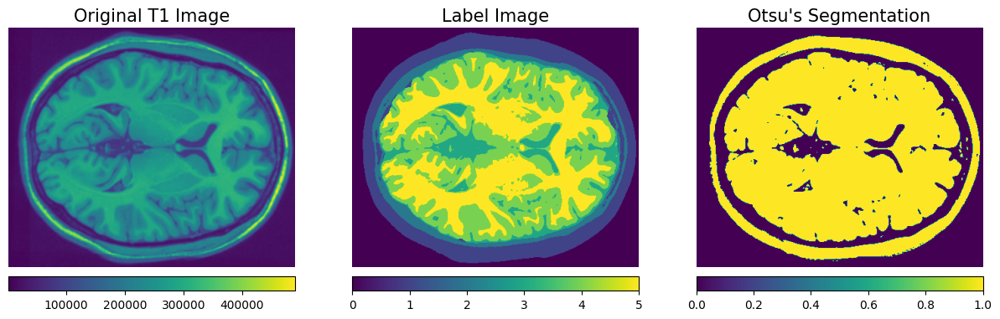

Slice 1 Image
Dice coefficient: 0.6699499364023134
Jaccard index: 0.5037027964121504
Pixel accuracy: 0.5628666982016747
Sensitivity: 0.7882080618052074
Specificity: 0.2727100142382534
Computation Time: 1476995686745.7769


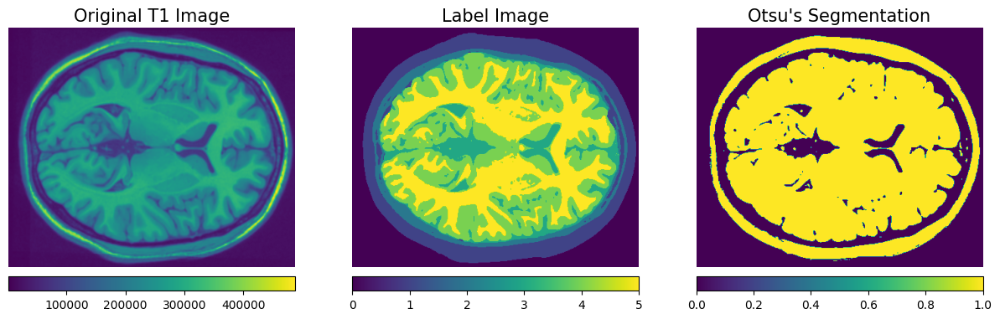

Slice 2 Image
Dice coefficient: 0.6614407369446659
Jaccard index: 0.49414378219974475
Pixel accuracy: 0.5550899597592205
Sensitivity: 0.7829518902402492
Specificity: 0.27079907310509793
Computation Time: 1477963428176.0022


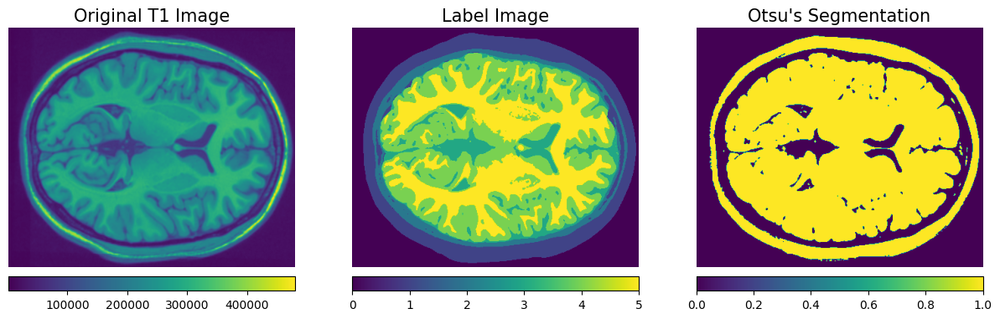

Slice 3 Image
Dice coefficient: 0.6543237405946776
Jaccard index: 0.4862415726081358
Pixel accuracy: 0.5484791744684392
Sensitivity: 0.7791315166595861
Specificity: 0.26829717824428184
Computation Time: 1478699329745.0303


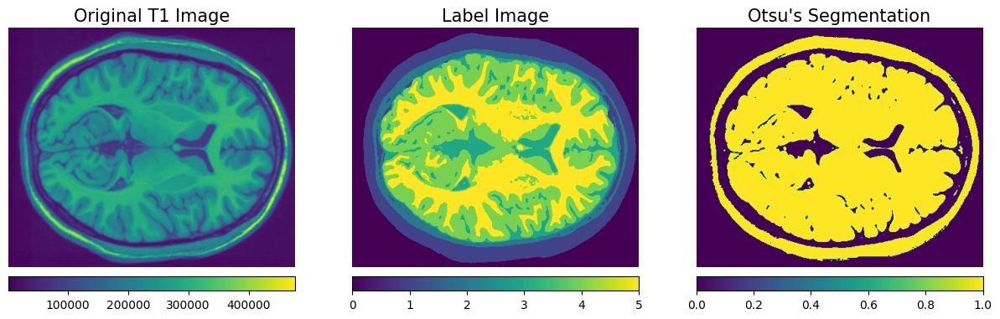

Slice 4 Image
Dice coefficient: 0.6515168003482336
Jaccard index: 0.4831478809053623
Pixel accuracy: 0.5465608289326825
Sensitivity: 0.7755223334704887
Specificity: 0.27057807821598484
Computation Time: 1479452324335.2957


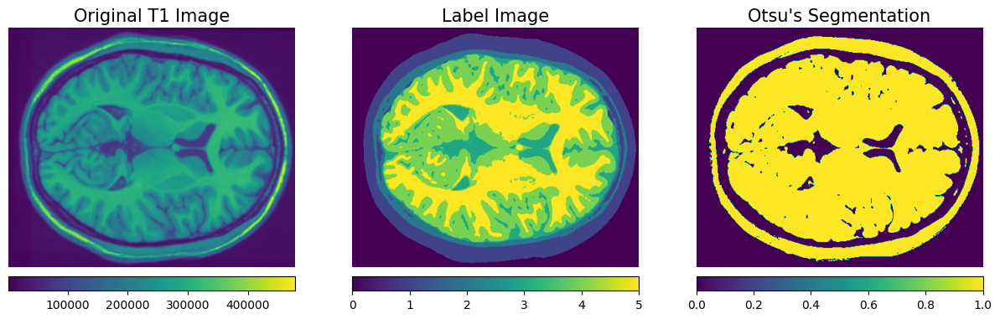

Slice 5 Image
Dice coefficient: 0.6586588504249762
Jaccard index: 0.4910449892882647
Pixel accuracy: 0.5517643309965451
Sensitivity: 0.7837809085244457
Specificity: 0.266159055618955
Computation Time: 1480216475059.546


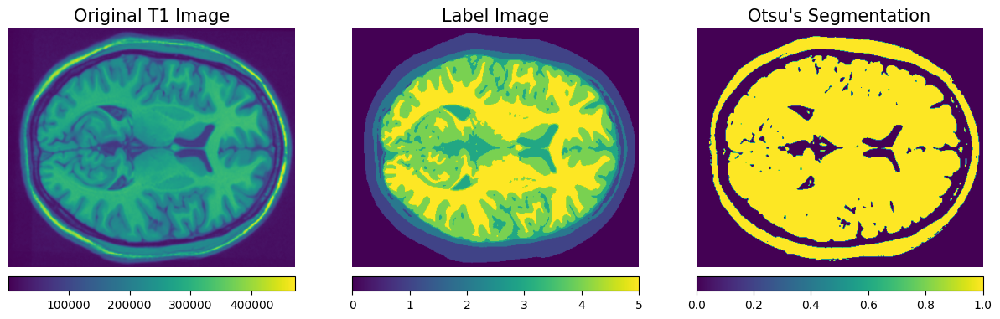

Slice 6 Image
Dice coefficient: 0.6637251208438959
Jaccard index: 0.49669804558704067
Pixel accuracy: 0.5584630089207862
Sensitivity: 0.7802549205062379
Specificity: 0.27793707156827374
Computation Time: 1480941364027.7812


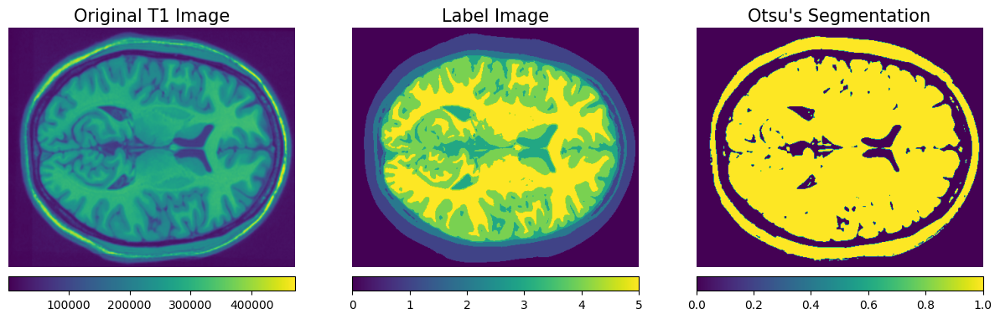

Slice 7 Image
Dice coefficient: 0.662724170664751
Jaccard index: 0.4955777679719126
Pixel accuracy: 0.5571687228935955
Sensitivity: 0.7808527682471547
Specificity: 0.27573026015518026
Computation Time: 1481945759708.0525


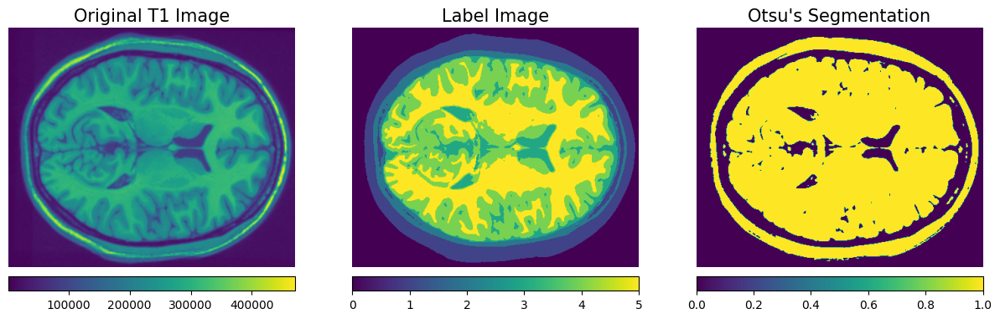

Slice 8 Image
Dice coefficient: 0.6690554330547152
Jaccard index: 0.5026921854381182
Pixel accuracy: 0.5607938546868221
Sensitivity: 0.791666034616143
Specificity: 0.26600813480534574
Computation Time: 1482771662018.048


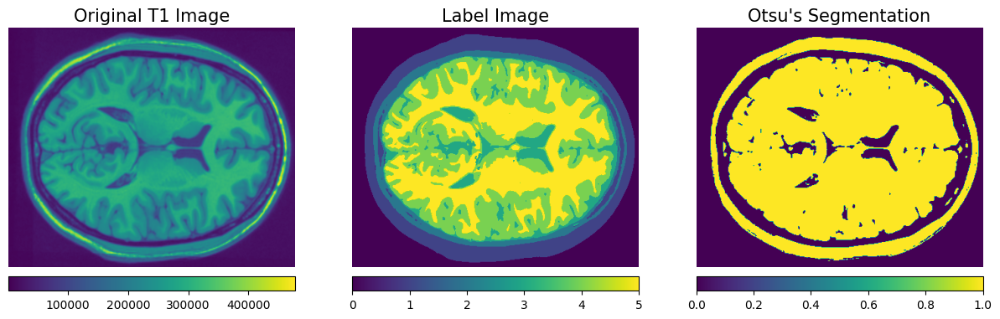

Slice 9 Image
Dice coefficient: 0.6755509994874423
Jaccard index: 0.510061919504644
Pixel accuracy: 0.5665867853474837
Sensitivity: 0.7963746223564955
Specificity: 0.26619273301737756
Computation Time: 1483824045545.2244
------ Overall Metrics ------
Dice Coefficient: 0.49784869515711516
Jaccard Index: 0.664696712977515
Pixel Accuracy: 0.5578332458333223
Sensitivity: 0.7858530001717645
Specificity: 0.2700416484772775
Computation Time: 1479902790487.73


In [11]:
# Function call
result_otsu_segmentation = segment_images(T1, "otsu")

Image Segmentation using Multi Otsu

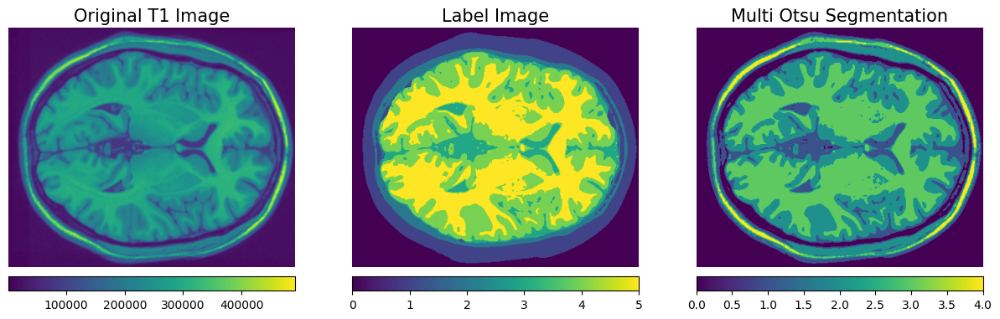

Slice 0 Image
Dice coefficient: 0.1784301661246374
Jaccard index: 0.09795406292221578
Pixel accuracy: 0.43094392955181693
Sensitivity: 0.14339304679951462
Specificity: 0.6487050849011906
Computation Time: 1501008761252.8513


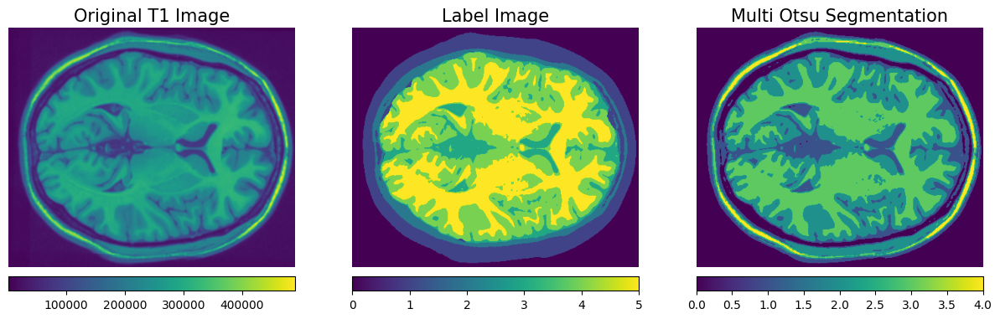

Slice 1 Image
Dice coefficient: 0.17695544757776613
Jaccard index: 0.0970658930647909
Pixel accuracy: 0.4304575097669273
Sensitivity: 0.14223498699821224
Specificity: 0.6482947239122507
Computation Time: 1505108178962.9846


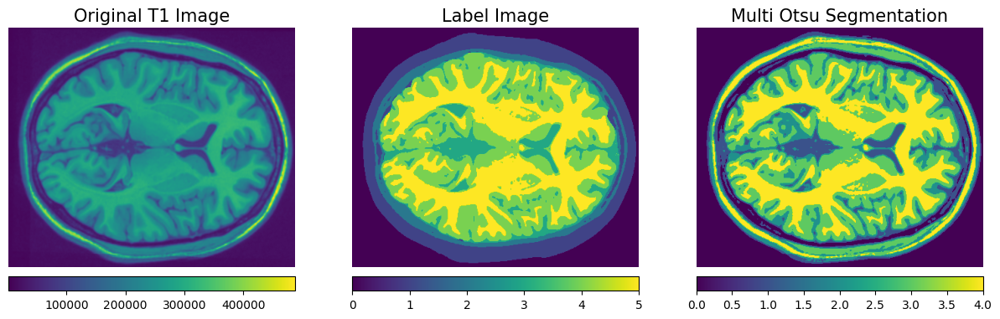

Slice 2 Image
Dice coefficient: 0.4051466724763235
Jaccard index: 0.25403381331961944
Pixel accuracy: 0.4837156878859746
Sensitivity: 0.3634721512519162
Specificity: 0.5963739338795891
Computation Time: 1510038129153.885


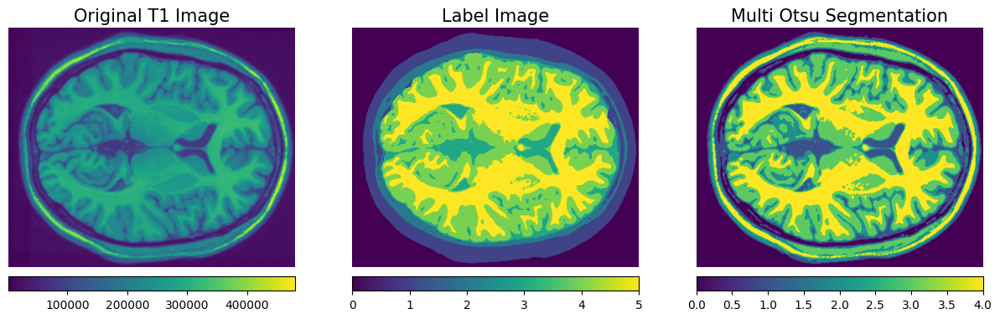

Slice 3 Image
Dice coefficient: 0.40079566821952767
Jaccard index: 0.2506219250752668
Pixel accuracy: 0.4823639299035648
Sensitivity: 0.35889531215536213
Specificity: 0.5974192962455755
Computation Time: 1514974955630.954


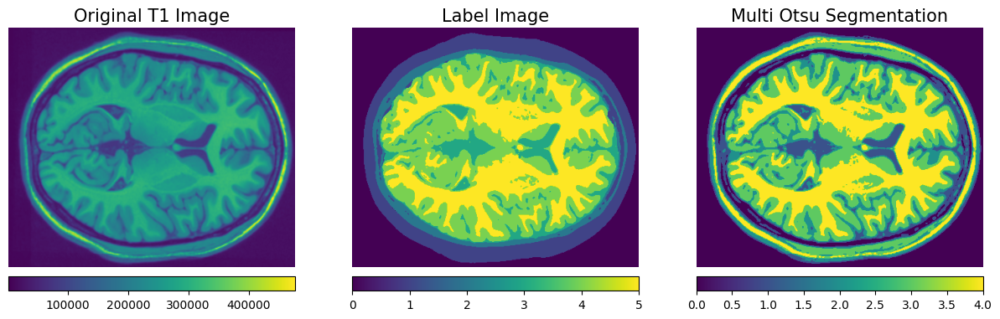

Slice 4 Image
Dice coefficient: 0.4079032393809671
Jaccard index: 0.25620505579219177
Pixel accuracy: 0.48381083373335754
Sensitivity: 0.3675088229775268
Specificity: 0.5928177181583176
Computation Time: 1518905192682.0208


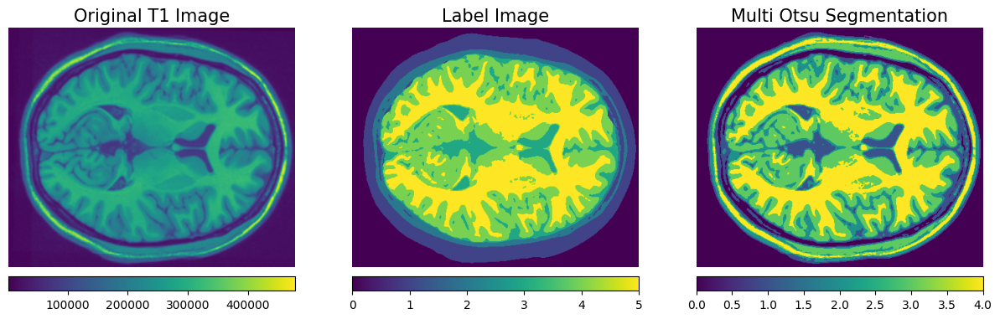

Slice 5 Image
Dice coefficient: 0.4092747733890411
Jaccard index: 0.2572881642551186
Pixel accuracy: 0.48500735972856324
Sensitivity: 0.36783424337274406
Specificity: 0.5953581091391767
Computation Time: 1523849380638.0881


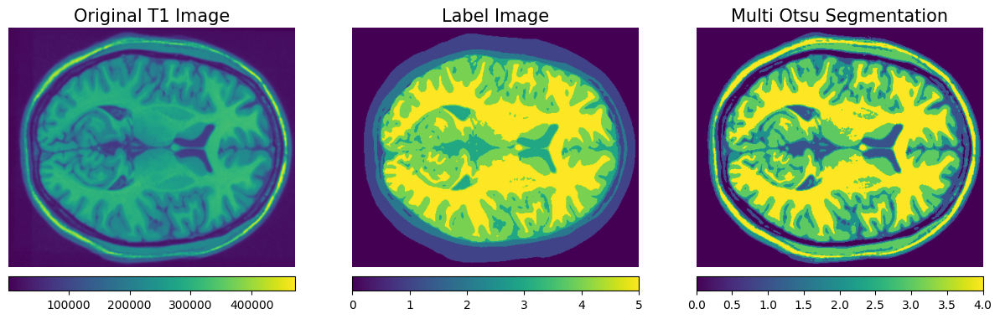

Slice 6 Image
Dice coefficient: 0.4225218831322451
Jaccard index: 0.2678464307138572
Pixel accuracy: 0.49097373004097333
Sensitivity: 0.37928495859514366
Specificity: 0.5987014760468263
Computation Time: 1528016953231.1426


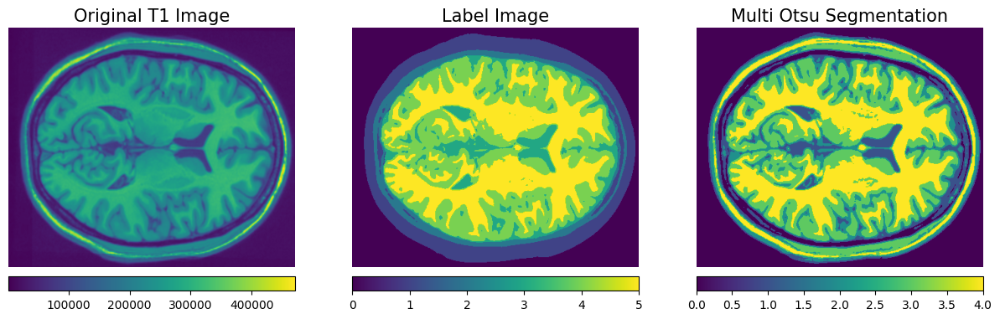

Slice 7 Image
Dice coefficient: 0.4229823904406479
Jaccard index: 0.2682166564765482
Pixel accuracy: 0.490783135886384
Sensitivity: 0.3802912834272888
Specificity: 0.5972751664167618
Computation Time: 1532053431020.975


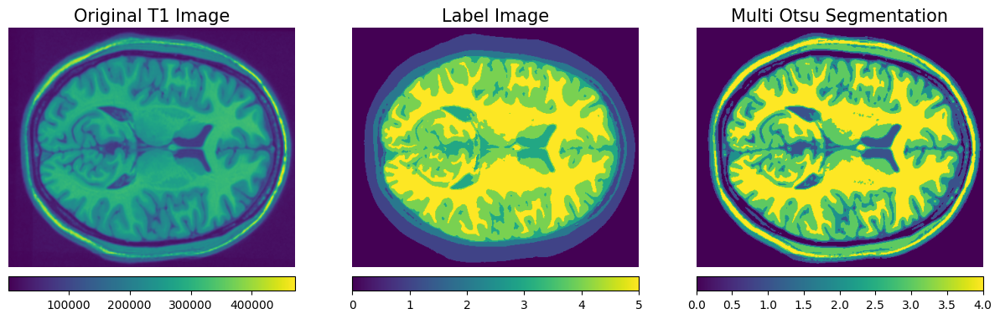

Slice 8 Image
Dice coefficient: 0.4262444009480058
Jaccard index: 0.27084535947307753
Pixel accuracy: 0.49181465936824575
Sensitivity: 0.38381541971061917
Specificity: 0.5963348117957324
Computation Time: 1536756685804.9375


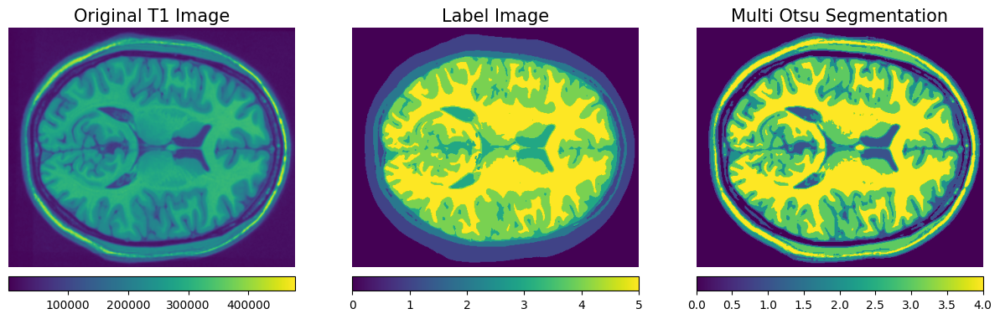

Slice 9 Image
Dice coefficient: 0.4324334381986449
Jaccard index: 0.2758628875712415
Pixel accuracy: 0.4940349963890994
Sensitivity: 0.390153256507074
Specificity: 0.5954673377985797
Computation Time: 1540669295731.2368
------ Overall Metrics ------
Dice Coefficient: 0.22959402486639274
Jaccard Index: 0.3682688079887807
Pixel Accuracy: 0.47639057722549066
Sensitivity: 0.3276883481795402
Specificity: 0.6066747658294
Computation Time: 1521138096410.9077


In [12]:
#Function call
result_multi_otsu = segment_images(T1, 'multi_otsu', 5)

Image Segmentation using KMeans Clustering

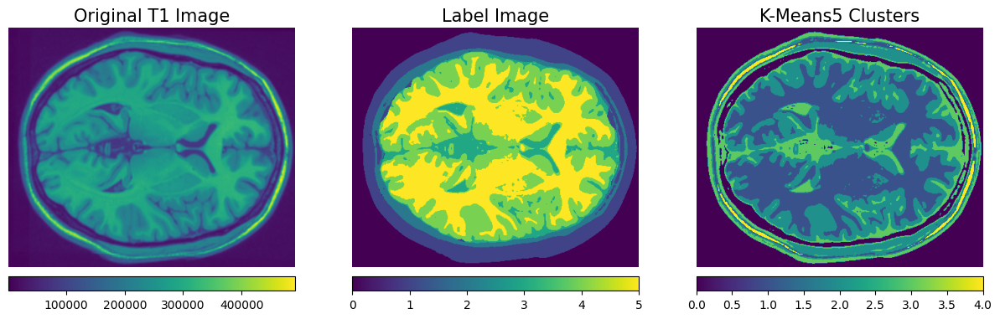

Slice 0 Image
Dice coefficient: 0.25771737194287886
Jaccard index: 0.14791938333809151
Pixel accuracy: 0.47295776832534914
Sensitivity: 0.19344943023716363
Specificity: 0.7237832845092614
Computation Time: 1542527421175.3062


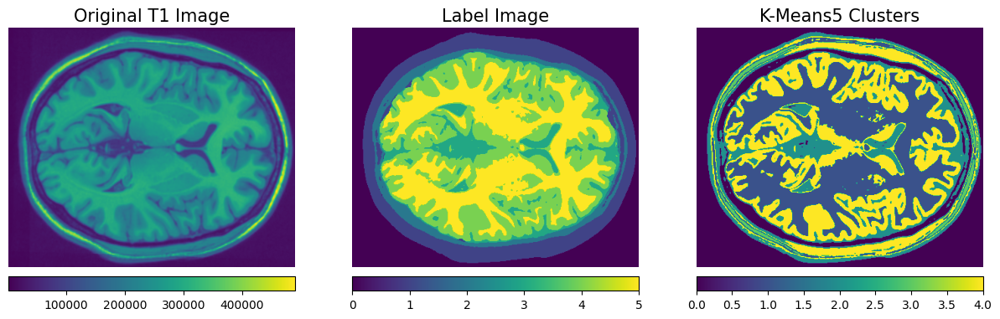

Slice 1 Image
Dice coefficient: 0.5921082911559277
Jaccard index: 0.420563802909294
Pixel accuracy: 0.5953618885057141
Sensitivity: 0.49330103201690234
Specificity: 0.7455285251512287
Computation Time: 1544021837368.4653


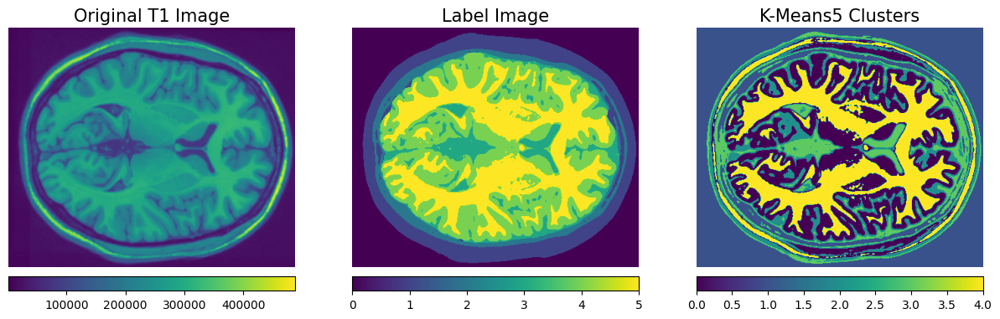

Slice 2 Image
Dice coefficient: 0.4522818535766089
Jaccard index: 0.2922249471725735
Pixel accuracy: 0.5217776166200968
Sensitivity: 0.37841338783852835
Specificity: 0.6781990811980108
Computation Time: 1546785768270.9712


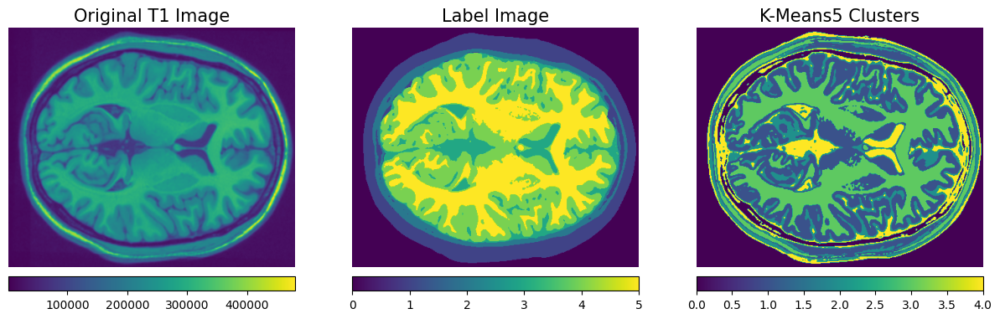

Slice 3 Image
Dice coefficient: 0.15953759424116545
Jaccard index: 0.08668343006734065
Pixel accuracy: 0.4237139494523479
Sensitivity: 0.12908628321988602
Specificity: 0.6403387522888031
Computation Time: 1548310788054.207


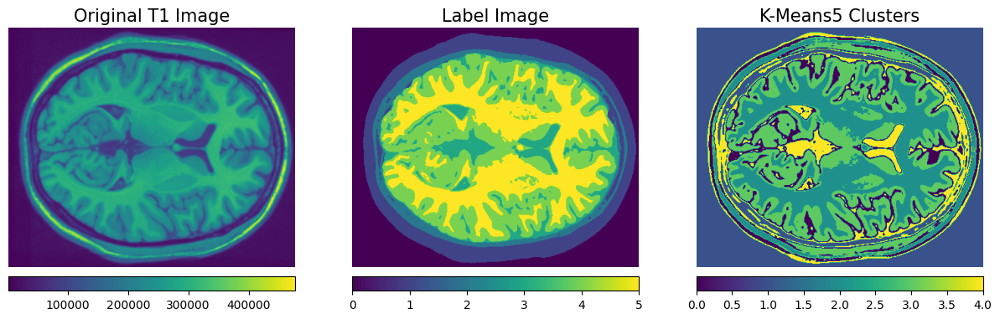

Slice 4 Image
Dice coefficient: 0.030101452400142968
Jaccard index: 0.01528071201271703
Pixel accuracy: 0.3672616496523182
Sensitivity: 0.026734971378338017
Specificity: 0.5649142647416454
Computation Time: 1549994759099.6826


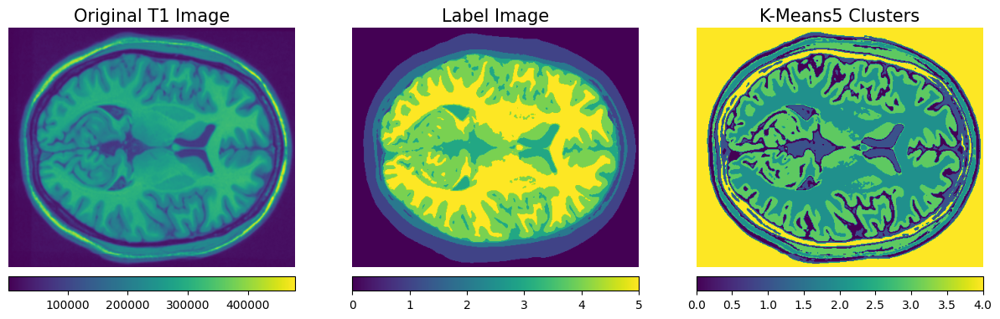

Slice 5 Image
Dice coefficient: 0.054313866248229155
Jaccard index: 0.027915019440210742
Pixel accuracy: 0.3431337248194804
Sensitivity: 0.05497272453711444
Specificity: 0.49366323304765375
Computation Time: 1551939780867.9968


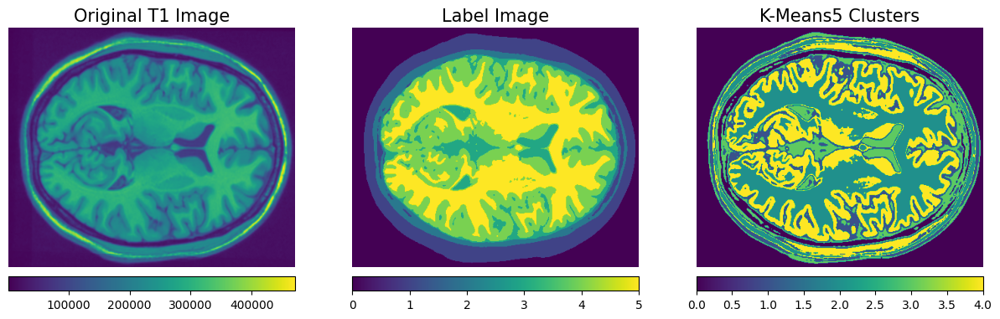

Slice 6 Image
Dice coefficient: 0.5083813765503964
Jaccard index: 0.3408253078623303
Pixel accuracy: 0.5376914538171732
Sensitivity: 0.44455970819679724
Specificity: 0.6460090354682546
Computation Time: 1553558338343.057


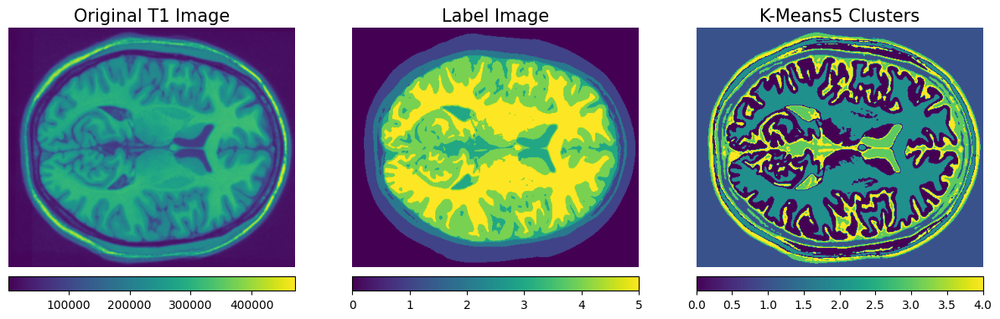

Slice 7 Image
Dice coefficient: 0.20456689218629548
Jaccard index: 0.11393735099125815
Pixel accuracy: 0.4374779903744571
Sensitivity: 0.16534269017918188
Specificity: 0.6491198500745413
Computation Time: 1555252469692.4385


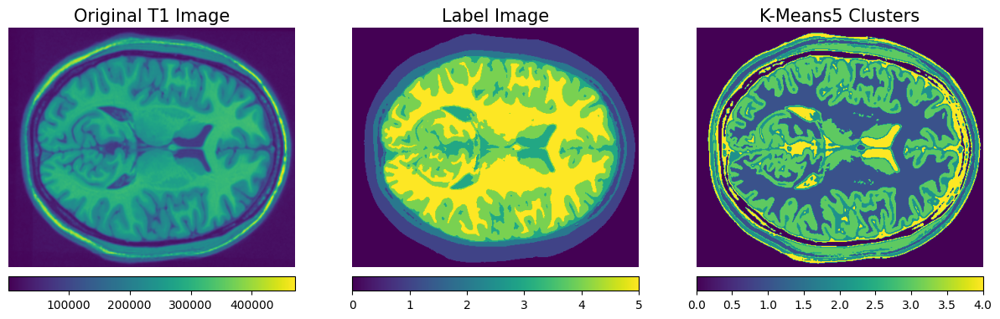

Slice 8 Image
Dice coefficient: 0.16311737377953014
Jaccard index: 0.08880119581464872
Pixel accuracy: 0.4207979064186511
Sensitivity: 0.13414121186941477
Specificity: 0.6290577491643122
Computation Time: 1557385147046.7402


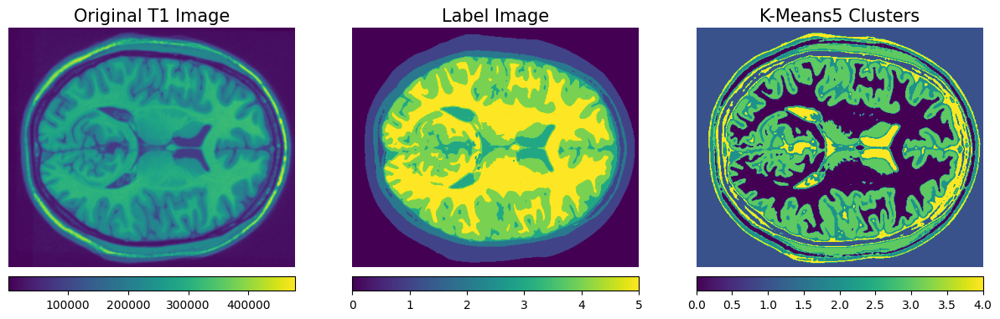

Slice 9 Image
Dice coefficient: 0.05403124980753715
Jaccard index: 0.027765733546437105
Pixel accuracy: 0.38658397049455956
Sensitivity: 0.045315784852037994
Specificity: 0.6016562931326337
Computation Time: 1560292839582.6094
------ Overall Metrics ------
Dice Coefficient: 0.15619168831549018
Jaccard Index: 0.24761573218887123
Pixel Accuracy: 0.45067579184801476
Sensitivity: 0.20653172243253648
Specificity: 0.6372270068776346
Computation Time: 1551006914950.1475


In [13]:
# Function call
result_kmeans_segmentation = segment_images(T1, "kmeans")

Image Segmentation using Adaptive Mean thresholding

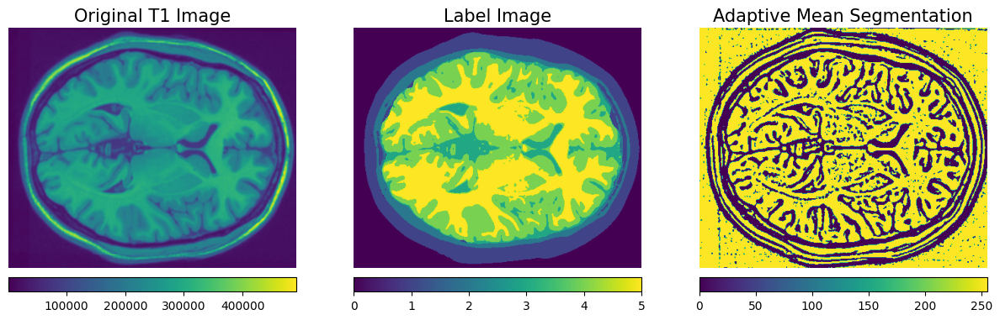

Slice 0 Image
Dice coefficient: 0.020066404780261685
Jaccard index: 0.010134887770331844
Pixel accuracy: 0.014851208605880366
Sensitivity: 0.6791769784027468
Specificity: 0.004836436547383973
Computation Time: 1561123200544.6797


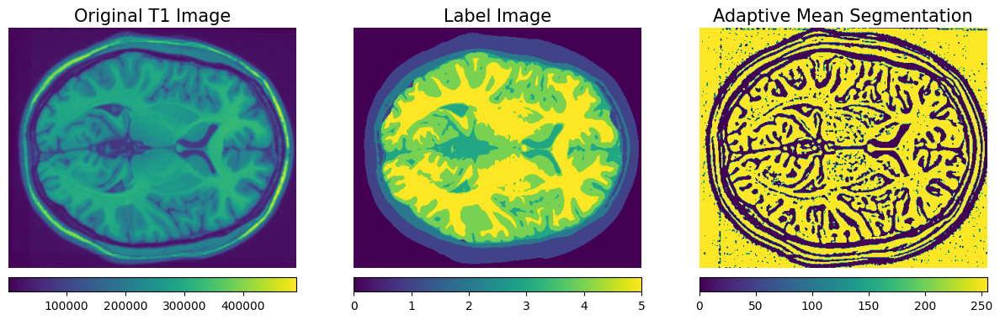

Slice 1 Image
Dice coefficient: 0.01993920283303279
Jaccard index: 0.01006999525547974
Pixel accuracy: 0.014785733362304649
Sensitivity: 0.6778172233057045
Specificity: 0.004835200617208082
Computation Time: 1561849680067.8743


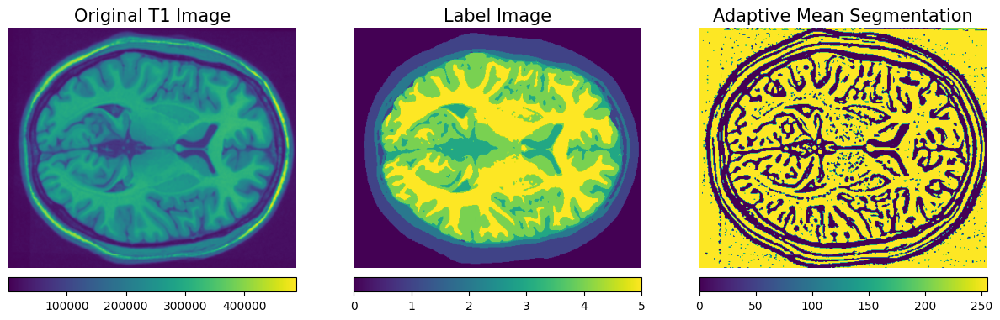

Slice 2 Image
Dice coefficient: 0.019826850279436564
Jaccard index: 0.010012685144344308
Pixel accuracy: 0.014683369493412873
Sensitivity: 0.6786893203883495
Specificity: 0.004788230792868897
Computation Time: 1562645101140.1396


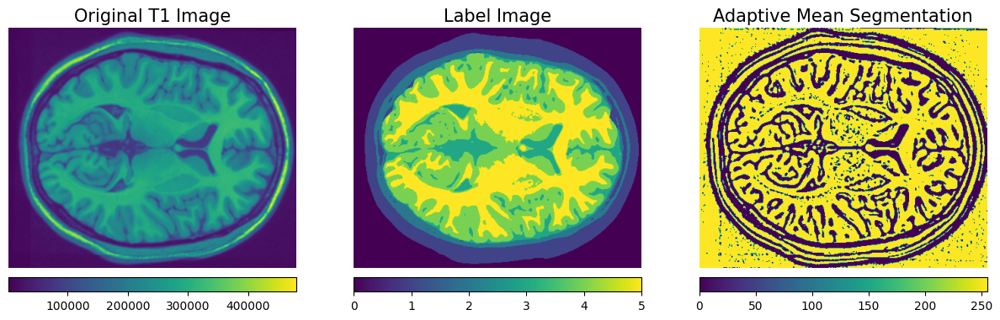

Slice 3 Image
Dice coefficient: 0.019785770696505552
Jaccard index: 0.00999173241142947
Pixel accuracy: 0.014617914640514368
Sensitivity: 0.6803324938061359
Specificity: 0.004742193295693267
Computation Time: 1563378346022.3474


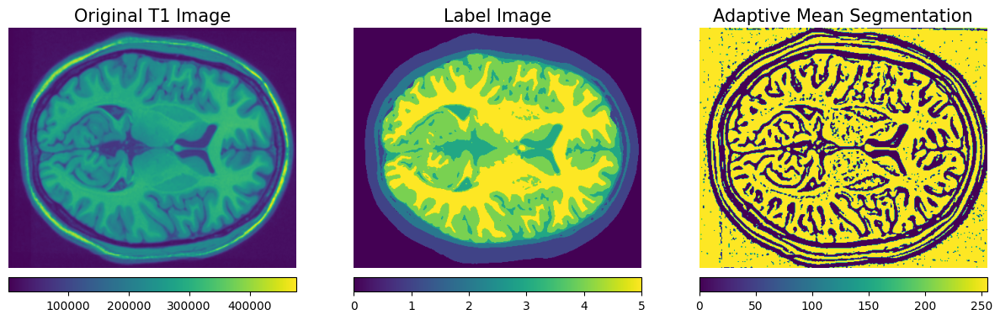

Slice 4 Image
Dice coefficient: 0.01967620308028206
Jaccard index: 0.009935851455649467
Pixel accuracy: 0.014617701899819176
Sensitivity: 0.6764993920949206
Specificity: 0.004798985591565774
Computation Time: 1564419321351.615


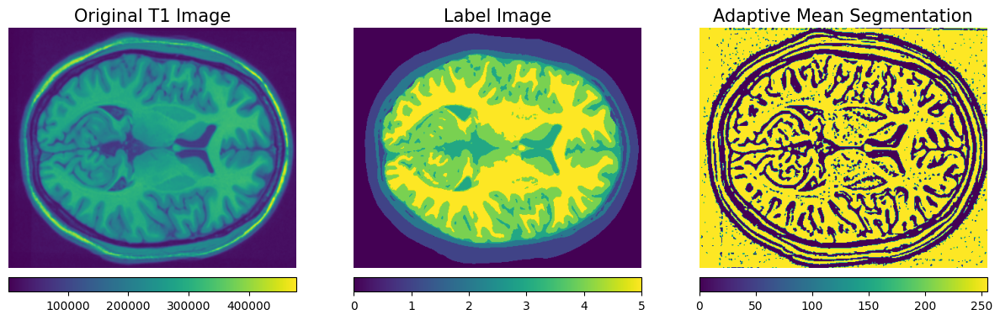

Slice 5 Image
Dice coefficient: 0.019687360300424336
Jaccard index: 0.009941541504987321
Pixel accuracy: 0.014622659373545838
Sensitivity: 0.6766578106072102
Specificity: 0.004798286404253426
Computation Time: 1565174964717.575


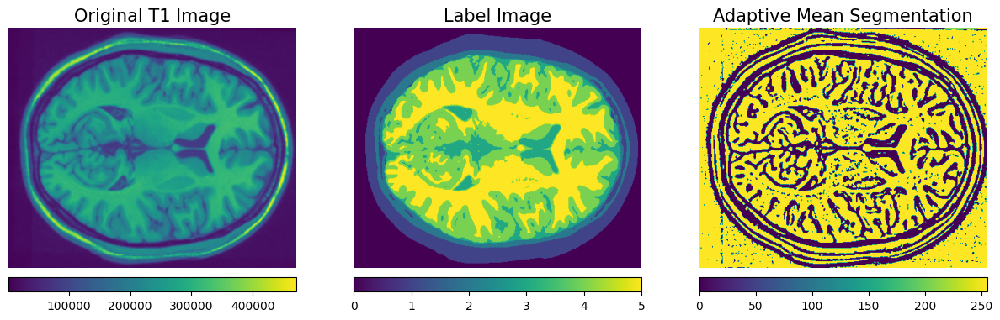

Slice 6 Image
Dice coefficient: 0.019677830511497966
Jaccard index: 0.009936681422185237
Pixel accuracy: 0.014608956822836845
Sensitivity: 0.6769674707385946
Specificity: 0.004789132502296545
Computation Time: 1565995864908.8198


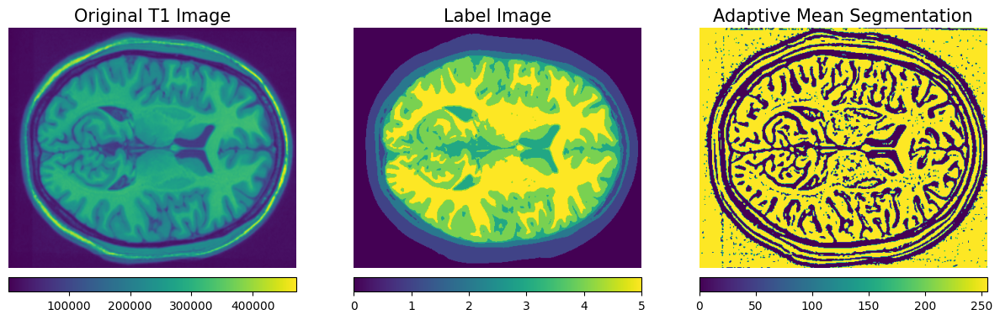

Slice 7 Image
Dice coefficient: 0.019580559879832714
Jaccard index: 0.009887077193427575
Pixel accuracy: 0.014581892509524533
Sensitivity: 0.6748229466324385
Specificity: 0.00481186290644201
Computation Time: 1566754097063.9978


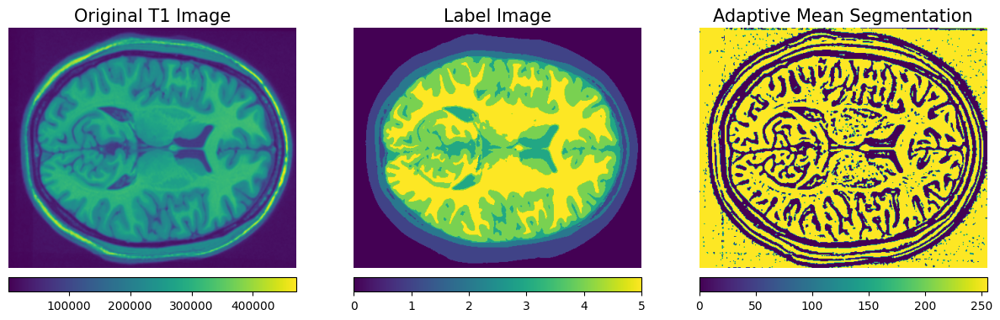

Slice 8 Image
Dice coefficient: 0.019544490399888183
Jaccard index: 0.009868684403738287
Pixel accuracy: 0.014571387434916228
Sensitivity: 0.6740478482234328
Specificity: 0.004819806354534167
Computation Time: 1567786372825.238


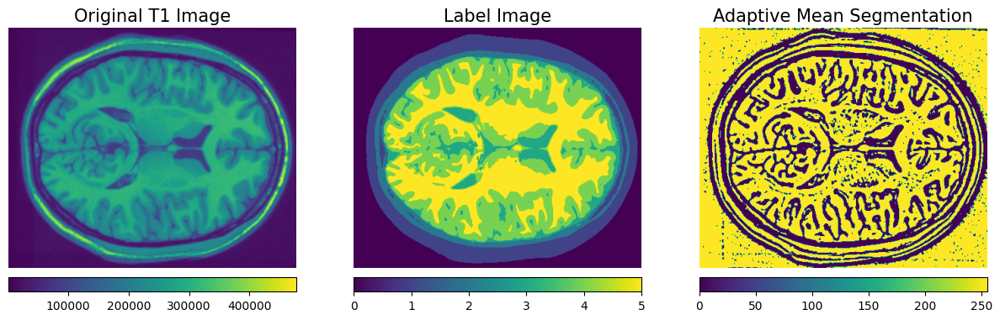

Slice 9 Image
Dice coefficient: 0.019483972406764798
Jaccard index: 0.009837826170203798
Pixel accuracy: 0.014566923579463103
Sensitivity: 0.6721281838045011
Specificity: 0.004846684980098431
Computation Time: 1568544187819.2107
------ Overall Metrics ------
Dice Coefficient: 0.009961696273177705
Jaccard Index: 0.019726864516792664
Pixel Accuracy: 0.014650774772221797
Sensitivity: 0.6767139668004034
Specificity: 0.0048066819992344575
Computation Time: 1564767113646.15


In [14]:
# Function call
result_adaptive_threshold_mean = segment_images(T1, "adaptive_threshold_mean")

Image Segmentation using Region Growing

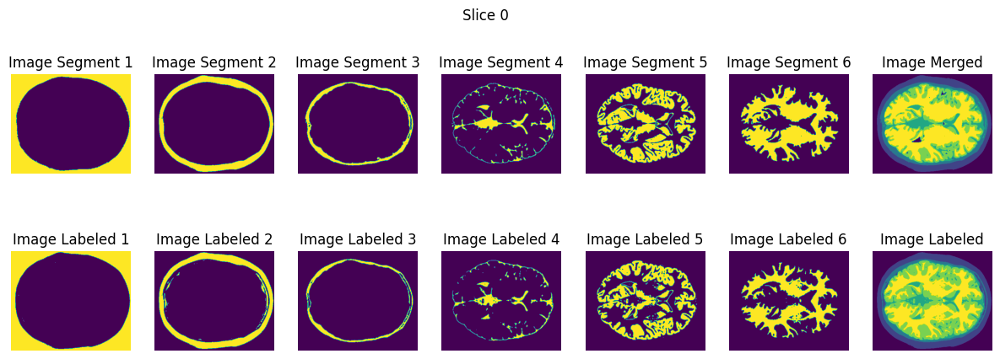

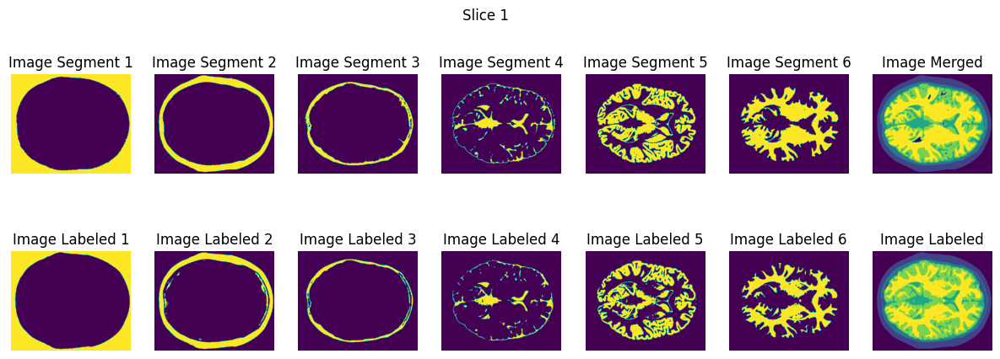

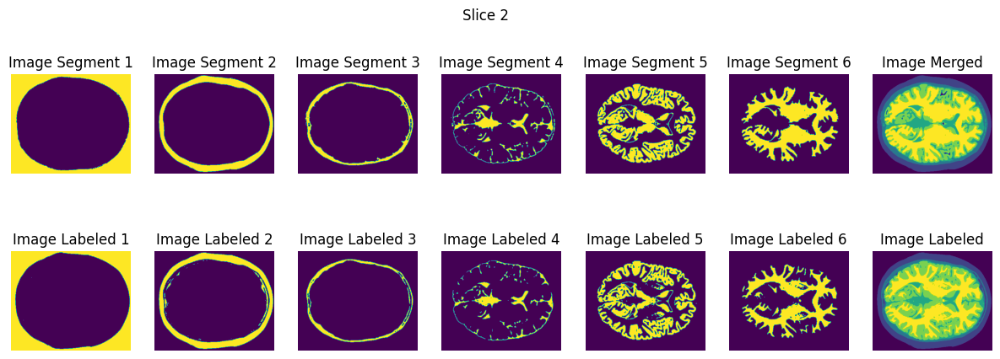

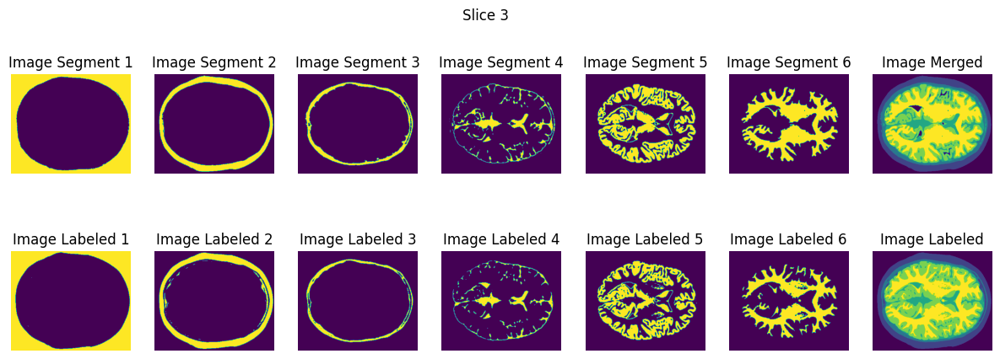

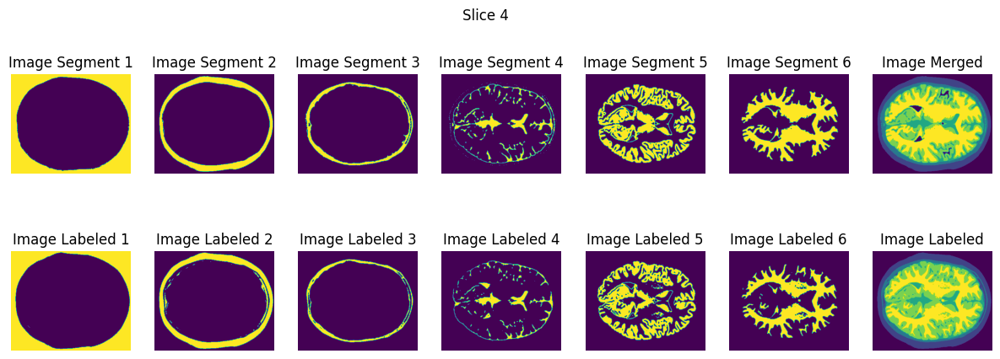

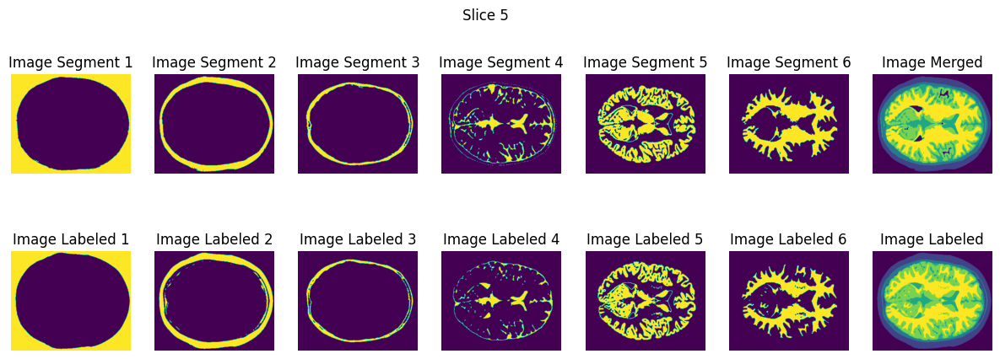

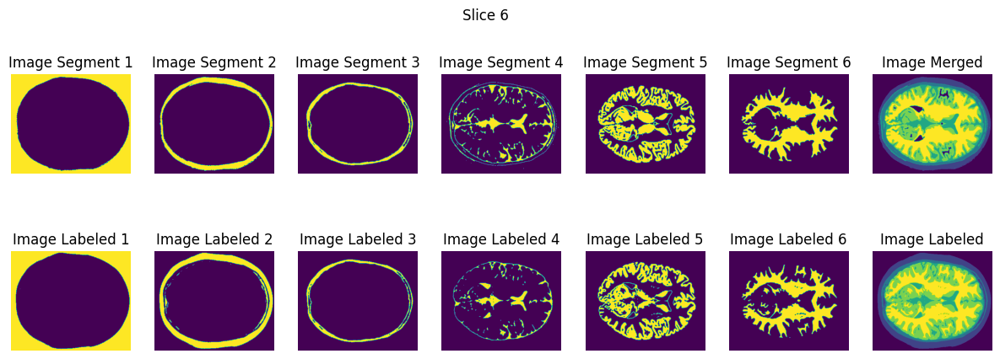

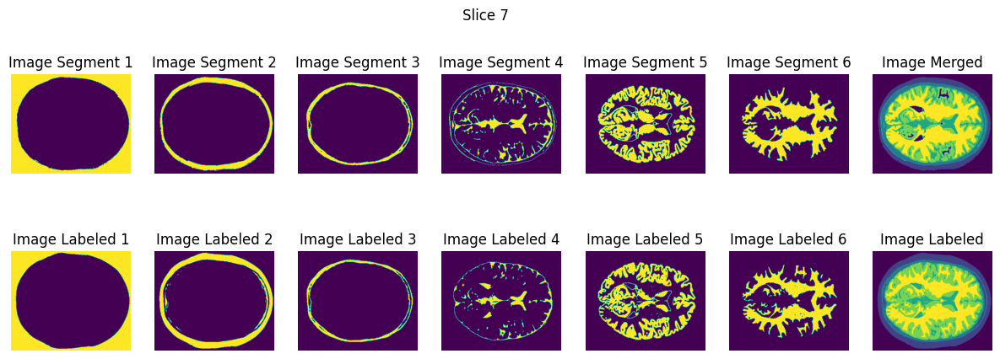

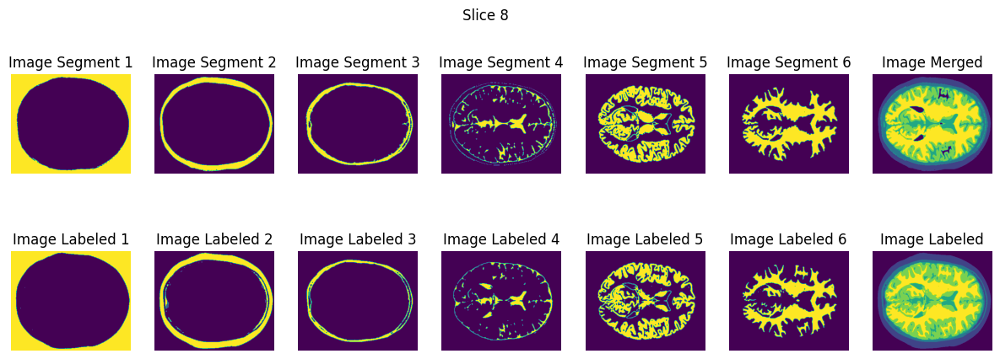

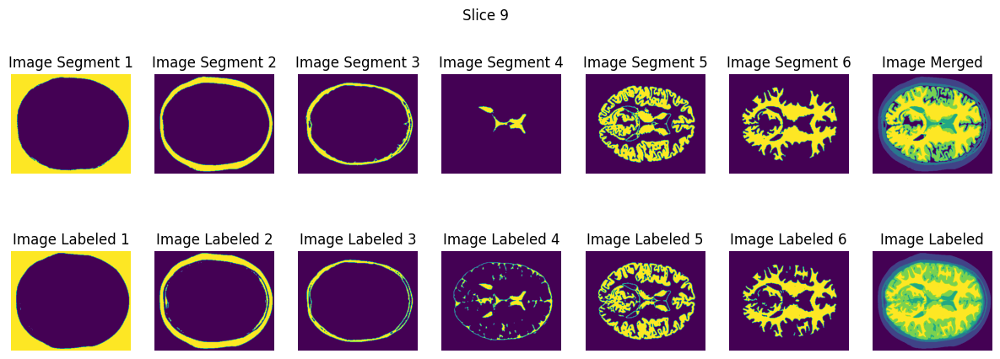

In [15]:
segmented_image_array = []
brain_array = []
# Seed points for Air, Skin/Scalp, Skull, CSF, Grey Matter, White MAtter in form of (y,x)
seed_points = [(50, 50), (70, 70), (80, 80), (180, 280), (160, 200), (120, 120)]
# Threshold for Air, Skin/Scalp, Skull, CSF, Grey Matter, White MAtter
thresh_array = [70, 150, 33, 66, 25, 30]
overall_computation_time = []
for i in range(10):
  t1 = time.monotonic_ns()
  image = T1[:, :, i]
  # Apply Region Growing to the segments
  # Air
  image_segmented1 = region_growing(image,seed_points[0], thresh_array[0])
  # Skin / Scalp
  image_segmented2 = region_growing(image,seed_points[1], thresh_array[1])
  # Skull
  image_segmented3 = region_growing(image,seed_points[2], thresh_array[2])
  # CSF
  image_segmented4 = region_growing(image, seed_points[3], thresh_array[3])
  # Grey Matter
  image_segmented5 = region_growing(image, seed_points[4], thresh_array[4])
  #White matter
  image_segmented6 = region_growing(image, seed_points[5], thresh_array[5])

  overall_computation_time.append(time.monotonic_ns() - t1)

  # image minimizations
  seg_1 = image_segmented1
  seg_2 = image_segmented2
  seg_3 = image_segmented3
  seg_4 = csf_refining(image_segmented4, image_segmented1, image_segmented2, image_segmented3, image_segmented5, image_segmented6)
  seg_5 = image_segmented5
  seg_6 = image_segmented6
  segmented_image_array.append([seg_1, seg_2, seg_3, seg_4, seg_5, seg_6])

  # Create subplots for visualisation
  fig, axes = plt.subplots(2, 7, figsize=(15, 5))
  for ind in range(6):
    # Display segmented images according to labels
    axes[0][ind].imshow(segmented_image_array[i][ind])
    axes[0][ind].set_title('Image Segment '+str(ind+1))
    axes[0][ind].axis('off')

    axes[1][ind].imshow(label[:,:,i]==ind)
    axes[1][ind].set_title('Image Labeled '+str(ind+1))
    axes[1][ind].axis('off')

  # Display the combined image with complete labeled image
  combined_image = merge_images([ seg_1, seg_2, seg_3, seg_4, seg_5, seg_6], [0, 40, 80, 120, 160, 200])
  axes[0][6].imshow(combined_image)
  axes[0][6].set_title('Image Merged')
  axes[0][6].axis('off')
  fig.suptitle("Slice "+str(i))

  axes[1][6].imshow(label[:,:,i])
  axes[1][6].set_title('Image Labeled')
  axes[1][6].axis('off')
  # Show the plot
  plt.show()

# Task 2: Result Evaluation

In [16]:
image_evaluation_metrics_for_region_growing(segmented_image_array,overall_computation_time,True, True)

------ Slice 0 ------
Dice Coefficient: 0.8828686753543536
Jaccard Index: 0.7959347721598027
Pixel Accuracy: 0.8064539894100733
Sensitivity: 0.9440591919665899
Specificity: 0.27277339082229235
Computation Time: 3374170873.6666665
------ Slice 1 ------
Dice Coefficient: 0.8798743648727106
Jaccard Index: 0.7912883643601208
Pixel Accuracy: 0.8019550463482172
Sensitivity: 0.9434464632018743
Specificity: 0.26983782014123936
Computation Time: 3374170873.6666665
------ Slice 2 ------
Dice Coefficient: 0.8839483216230275
Jaccard Index: 0.7972115144947955
Pixel Accuracy: 0.8068936603095486
Sensitivity: 0.9459398645838673
Specificity: 0.2731911090028489
Computation Time: 3374170873.6666665
------ Slice 3 ------
Dice Coefficient: 0.8808016382734043
Jaccard Index: 0.7922616354367733
Pixel Accuracy: 0.8050214750965673
Sensitivity: 0.9305067322658664
Specificity: 0.3054972504301599
Computation Time: 3374170873.6666665
------ Slice 4 ------
Dice Coefficient: 0.8756744010104814
Jaccard Index: 0.784575

# Part 3: Advanced 2D Tissue Segmentation / 3D Image Segmentation

In [17]:
# Function definition for 3D/Advanced 2D Segmentation
def region_growing_advanced_segmentation(image, seed_point, threshold):
    segmented = np.zeros_like(image, dtype=np.uint8)
    # Initializing deque with seed point
    queue = deque([seed_point])
    while queue:
        current_point = queue.popleft()
        x, y, z = current_point
        # Check if current point is within image bounds
        if (0 <= x < image.shape[0] and
            0 <= y < image.shape[1] and
            0 <= z < image.shape[2] and
            segmented[x, y, z] == 0):  # Check if point is unprocessed
            # Check if intensity is below threshold
            if abs(image[x, y, z] - image[seed_point]) < threshold:
                # Assign value 1 to segmented region
                segmented[x, y, z] = 1
                # Enqueue neighboring points
                for i in range(-1, 2):
                    for j in range(-1, 2):
                        for k in range(-1, 2):
                            queue.append((x + i, y + j, z + k))

    return segmented
# Function to plot Advanced Segmented Images
def plot_advanced_segmentation(segmented, region, top_view=False):
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(111, projection='3d')
    # Extract coordinates of segmented points
    x, y, z = np.nonzero(segmented)
    # Plot segmented points
    ax.scatter(x, y, z)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    if top_view:
        ax.view_init(azim=0, elev=90)
    text = 'MRI: 3D Visualization, Segmented Regions is - '+str(region)
    plt.title(text)
    plt.show()

# Function to visualise all segmented regions in single view
def plot_advanced_segmentation_single_view(top_view=False):
    segment_name = ['Air', 'Skin/Scalp', 'Skull', 'CSF', 'Grey Matter', 'White Matter']
    fig = plt.figure(figsize=(15, 10))
    # Plot images in the first row
    for i, img in enumerate([brain_array[0], brain_array[1], brain_array[2]]):
        ax = fig.add_subplot(2, 3, i+1, projection='3d')
        x, y, z = np.nonzero(img)
        ax.scatter(x, y, z, color='r',alpha=0.8)
        ax.set_title(f'Image {segment_name[i]}')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        if top_view:
            ax.view_init(azim=0, elev=90)
    # Plot images in the second row
    for i, img in enumerate([brain_array[3], brain_array[4], brain_array[5]]):
        ax = fig.add_subplot(2, 3, i+4, projection='3d')
        x, y, z = np.nonzero(img)
        ax.scatter(x, y, z,color='r',alpha=0.9)
        ax.set_title(f'Image {segment_name[i+3]}')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        if top_view:
            ax.view_init(azim=0, elev=90)
    plt.tight_layout()
    plt.show()

# Function to evaluate metric for Advanced Segmented Images
def evaluation_metrics_advanced_segmentation(brain_array, comp_time,print_metric_per_section=False, print_metrics_overall=True):
  jaccard_indexes = []
  dice_coefficients = []
  pixel_accuracies = []
  sensitivities = []
  specificities = []
  for i in range(len(brain_array)):
    ji = []
    dc = []
    pa = []
    se = []
    sp = []
    section_array = brain_array[i]
    for j in range(10):
      slice_image = section_array[:,:,j]
      dice_coefficient, jaccard_index, pixel_accuracy, sensitivity, specificity, tm = image_evaluation_metrics(slice_image, label[:,:,j]==i, comp_time[i],print_metrics = False)
      dc.append(dice_coefficient)
      ji.append(jaccard_index)
      pa.append(pixel_accuracy)
      se.append(sensitivity)
      sp.append(specificity)
    jaccard_indexes.append(ji)
    dice_coefficients.append(dc)
    pixel_accuracies.append(pa)
    sensitivities.append(se)
    specificities.append(sp)
    if print_metric_per_section:
        print(f"----- Section {i} -----", f"Dice Coefficient: {np.mean(dc)}", f"Jaccard Index: {np.mean(ji)}",
              f"Pixel Accuracy: {np.mean(pa)}", f"Sensitivity: {np.mean(se)}", f"Specificity: {np.mean(sp)}",
              f"Computation Time: {comp_time[i]}",sep='\n')

  if print_metrics_overall:
    print(f"------ Overall Metrics ------", f"Dice Coefficient: {np.mean(dice_coefficients)}",
        f"Jaccard Index: {np.mean(jaccard_indexes)}", f"Pixel Accuracy: {np.mean(pixel_accuracies)}",
        f"Sensitivity: {np.mean(sensitivities)}", f"Specificity: {np.mean(specificities)}",
        f"Computation Time: {np.mean(comp_time)}",sep='\n')


In [19]:
T1_data =  cv2.normalize(T1, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)
brain_array = []
segment_name = ['Air', 'Skin/Scalp', 'Skull', 'CSF', 'Grey Matter', 'White Matter']
# Seed points for Air, Skin/Scalp, Skull, CSF, Grey Matter, White MAtter
seed_points = [(50, 50, 0), (70, 70, 0), (80, 80, 0), (180, 280, 0), (160, 200, 0), (120, 120, 0)]
# Threshold for Air, Skin/Scalp, Skull, CSF, Grey Matter, White MAtter
thresh_array = [70, 150, 33, 50, 25, 30]
comp_time = []
for i in range(6):
    t1 = time.monotonic_ns()
    brain_array.append(region_growing_advanced_segmentation(T1_data,seed_points[i], thresh_array[i]))
    comp_time.append(time.monotonic_ns()-t1)
# Show evaluations for advanced segmented images
evaluation_metrics_advanced_segmentation(brain_array, comp_time, True)

----- Section 0 -----
Dice Coefficient: 0.9562540550617113
Jaccard Index: 0.9161768430879318
Pixel Accuracy: 0.916183073680422
Sensitivity: 0.999918176737674
Specificity: 0.0009040641523443699
Computation Time: 46126232596
----- Section 1 -----
Dice Coefficient: 0.9548017488608801
Jaccard Index: 0.9135189656248179
Pixel Accuracy: 0.9202874937043554
Sensitivity: 0.9150813185608732
Specificity: 0.9801357616786355
Computation Time: 20382397251
----- Section 2 -----
Dice Coefficient: 0.8500970050231139
Jaccard Index: 0.7392950117141486
Pixel Accuracy: 0.7392950117141486
Sensitivity: 1.0
Specificity: 0.0
Computation Time: 12314674676
----- Section 3 -----
Dice Coefficient: 0.49739890489306493
Jaccard Index: 0.3311229255017495
Pixel Accuracy: 0.35511579792687414
Sensitivity: 0.8988756238038716
Specificity: 0.05544501352553475
Computation Time: 27324706525
----- Section 4 -----
Dice Coefficient: 0.8677616623557091
Jaccard Index: 0.7664629772671432
Pixel Accuracy: 0.7794644193757109
Sensitivit

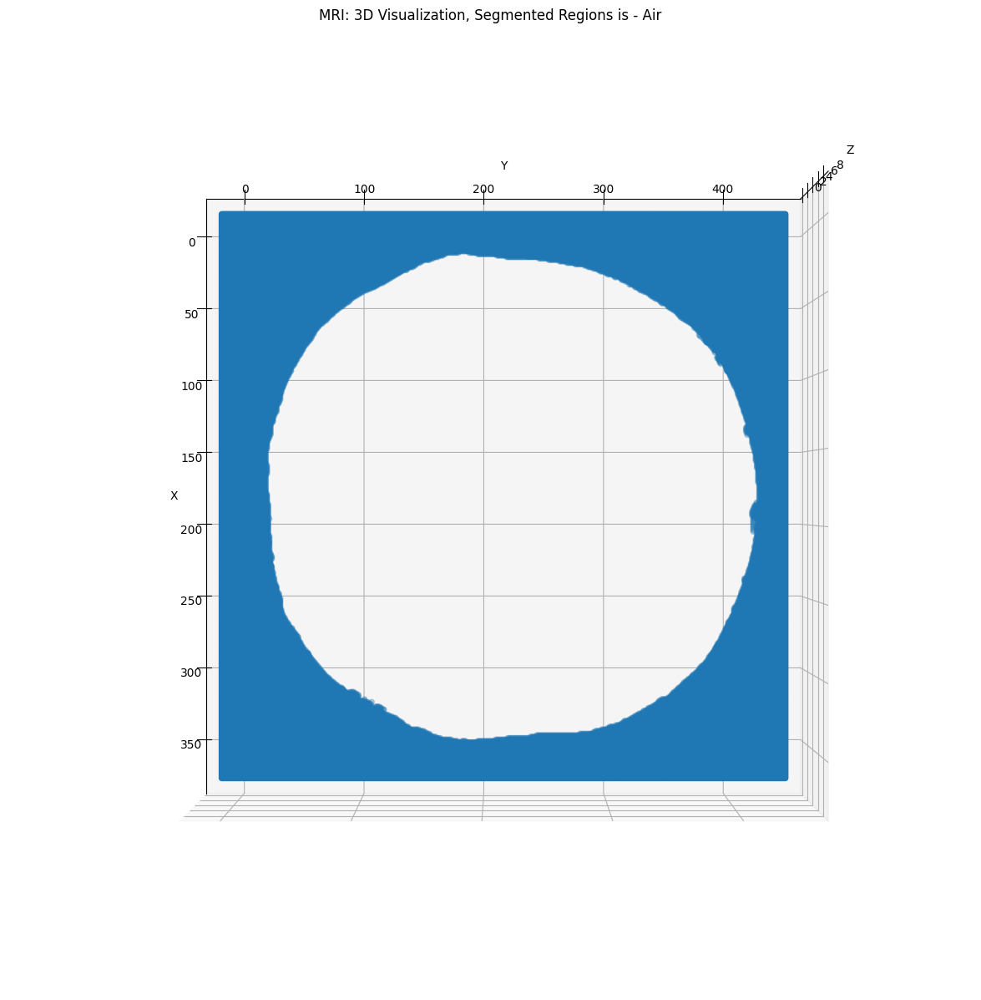

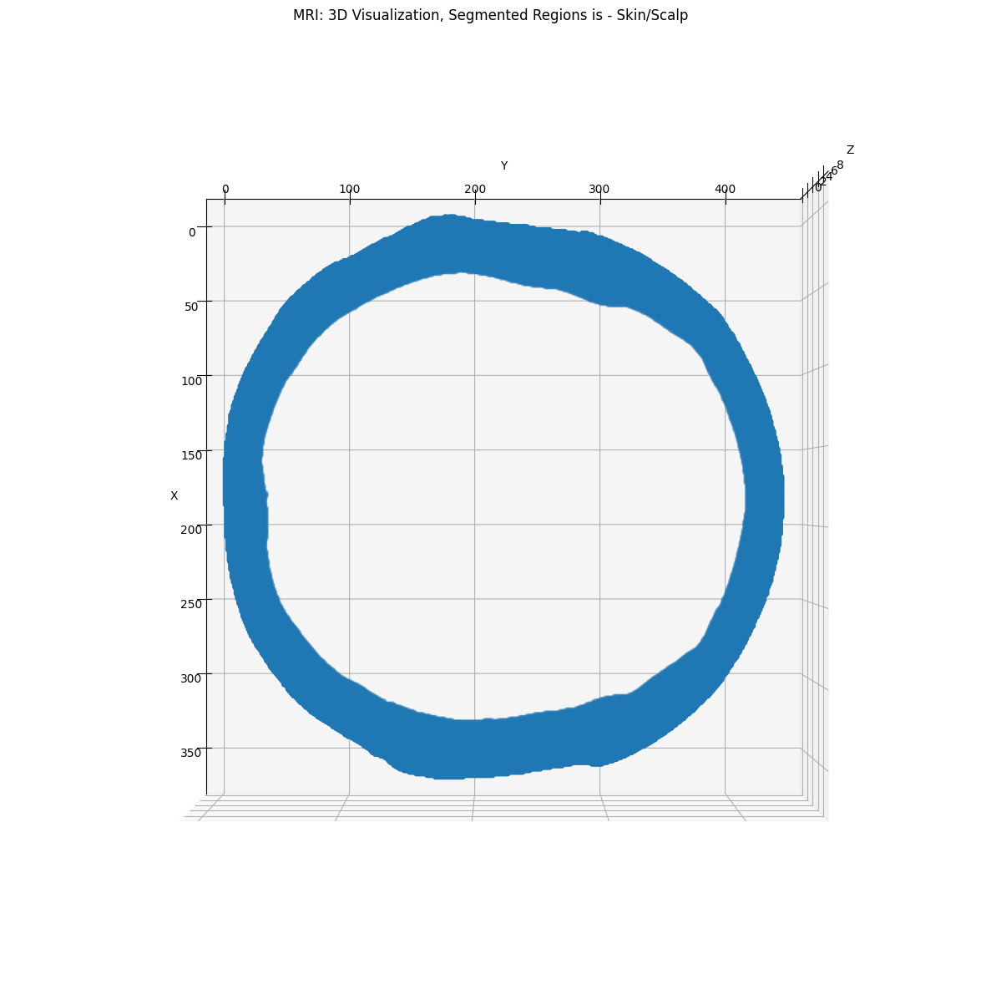

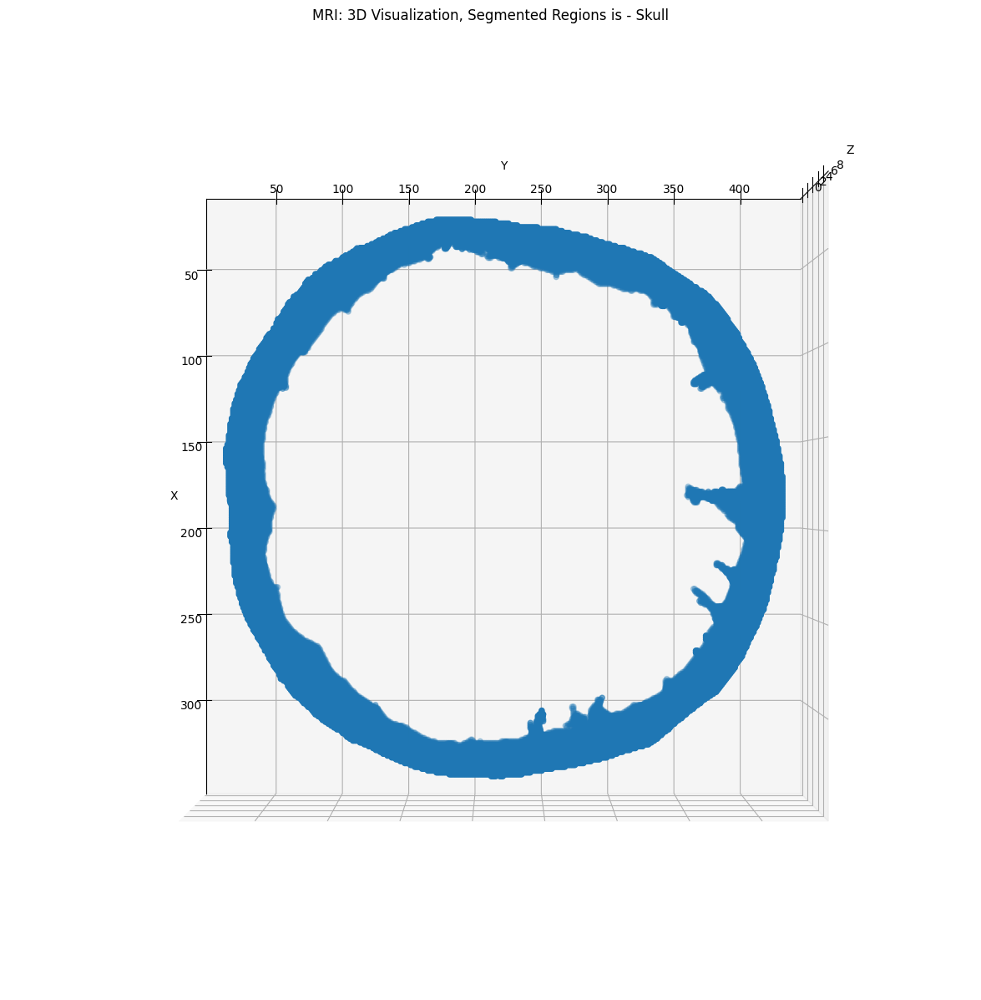

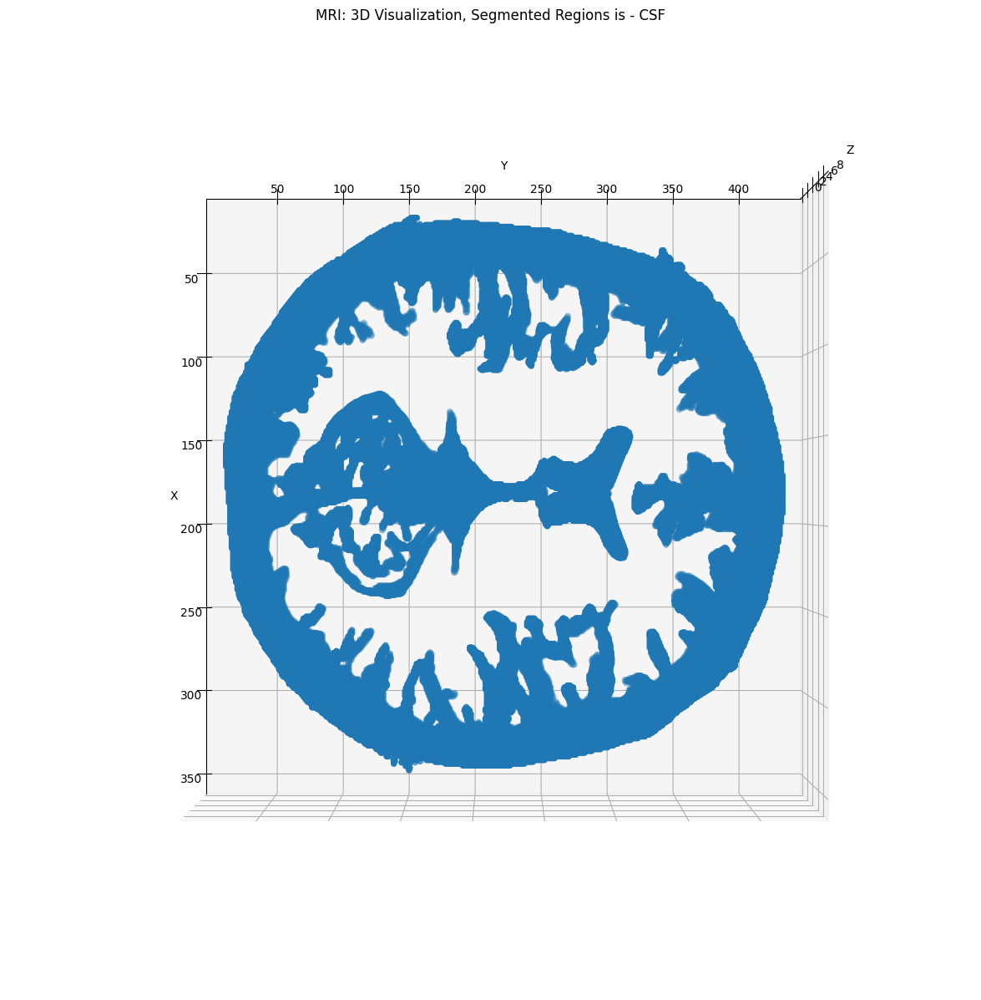

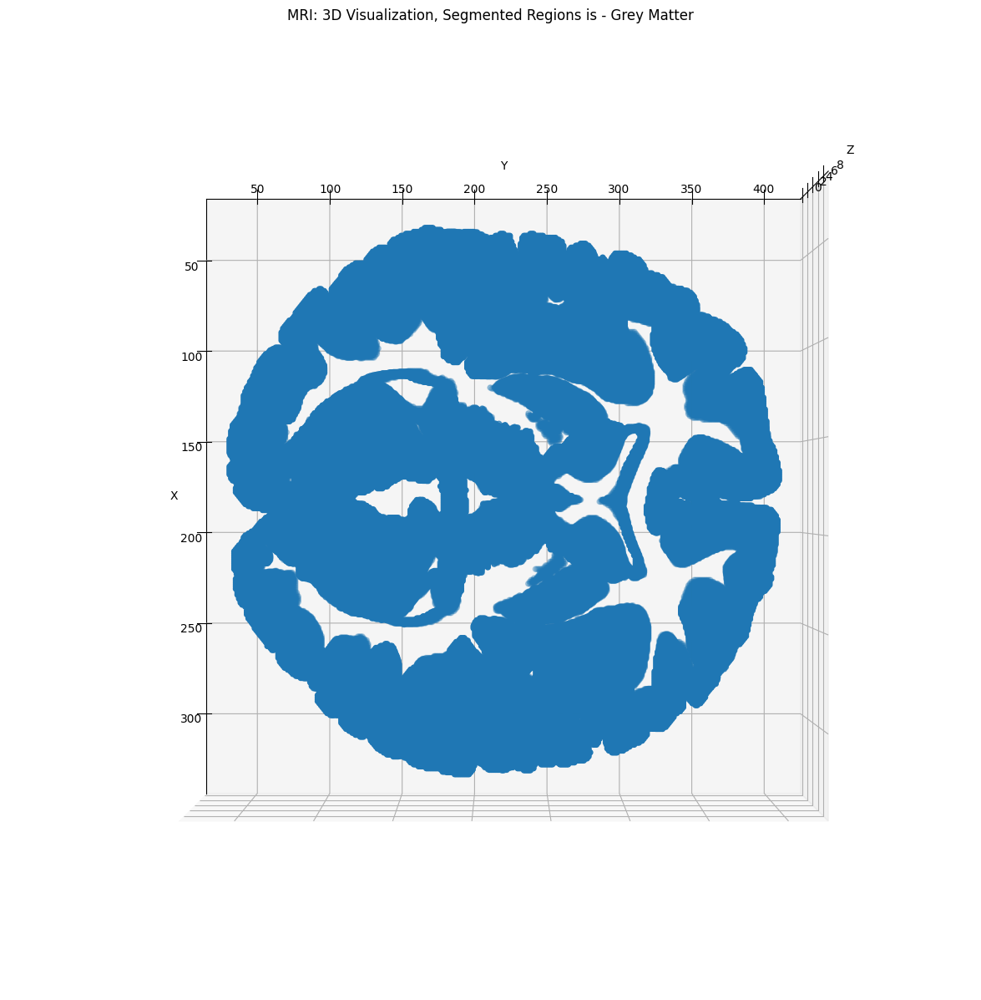

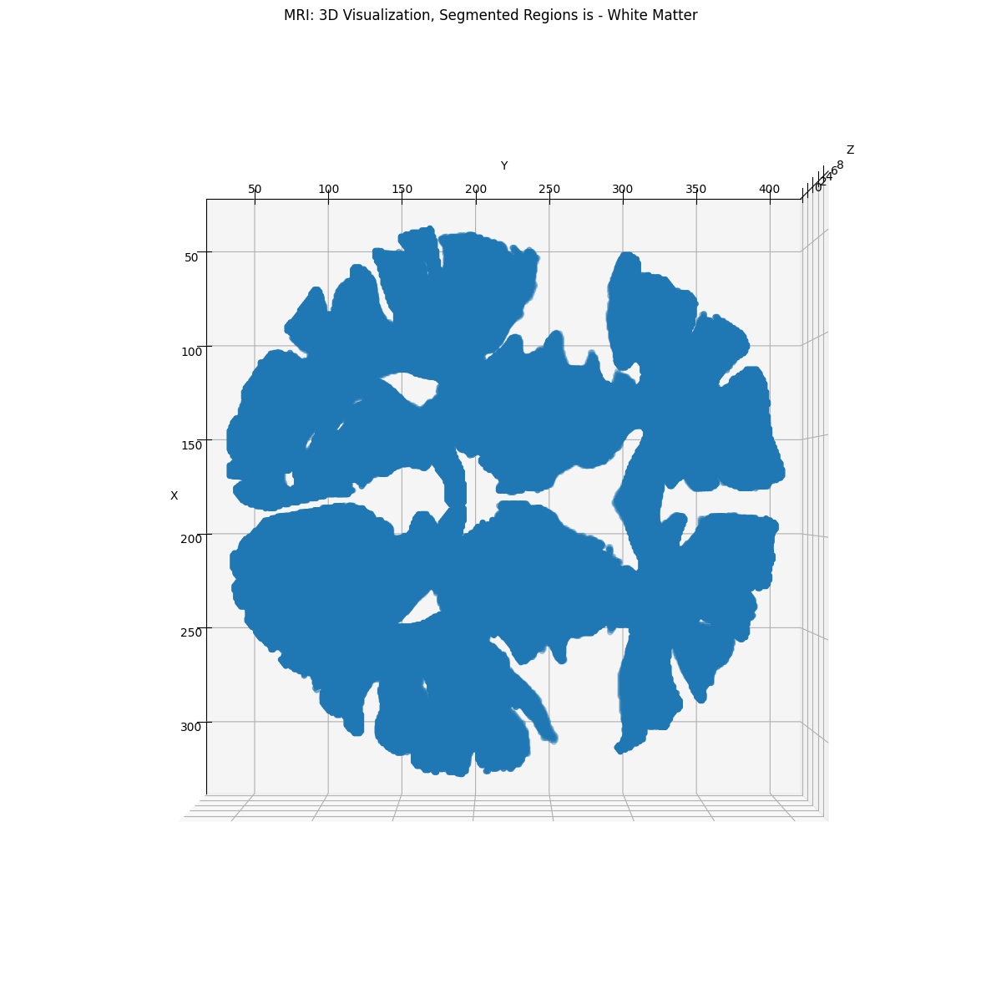

In [20]:
# Function call to visualize each region of segmented image from region growing 3D algorithm
for segment in range(len(brain_array)):
  plot_advanced_segmentation(brain_array[segment], segment_name[segment], True)

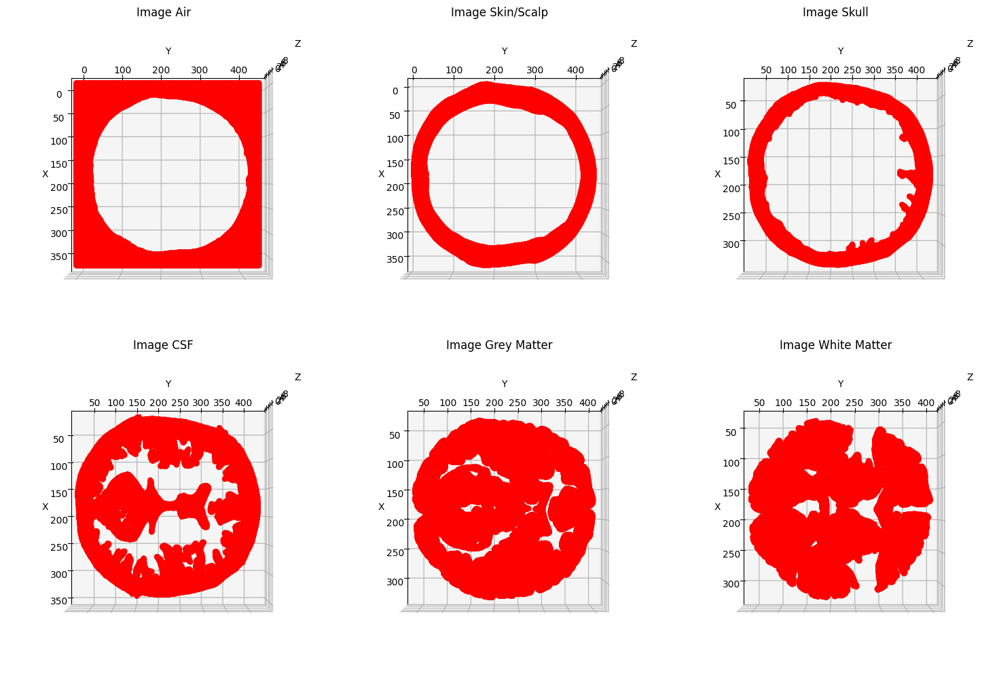

In [21]:
# Function call to visualise 3D images in single view
plot_advanced_segmentation_single_view(True)